In [1]:
import os, xarray as xr, numpy as np, pandas as pd, dask, random, netCDF4
import cartopy.crs as ccrs, matplotlib.pyplot as plt
from mpl_toolkits.axes_grid1.axes_divider import make_axes_locatable

from datetime import datetime as dt, timedelta
import datetime, time

import importlib
import matplotlib.patches as mpatches
import gc
from matplotlib.gridspec import GridSpec
dask.config.set({"array.slicing.split_large_chunks": False})
import sys
sys.path.insert(1, '/home/data/lab_hardik/udf/')


import h5netcdf

ERROR 1: PROJ: proj_create_from_database: Open of /home/lab_hardik/my_conda/share/proj failed


In [2]:
import random

In [3]:
import composite_funcs
import grad_funcs
importlib.reload(composite_funcs)
from composite_funcs import *
from grad_funcs import *

[30. 60. 90.]
[10. 30. 50.]
$\mathregular{\mathcal{S}'_{x}}$
["$u'$", "$v'$", "$w'$", "$\\mathcal{S}'_x$", "$\\mathcal{S}'_y$", "$\\mathcal{S}'_z$", '${u̅}$', '${v̅}$', '${w̅}$', '$\\mathcal{S}̅_x$', '$\\mathcal{S}̅_y$', '$\\mathcal{S}̅_z$']
dict_values(["$u'$$\\mathcal{S}'_x$", "$v'$$\\mathcal{S}'_y$", "$w'$$\\mathcal{S}'_z$", "$u'$$\\mathcal{S}̅_x$", "$v'$$\\mathcal{S}̅_y$", "$w'$$\\mathcal{S}̅_z$", "${u̅}$$\\mathcal{S}'_x$", "${v̅}$$\\mathcal{S}'_y$", "${w̅}$$\\mathcal{S}'_z$", '${u̅}$$\\mathcal{S}̅_x$', '${v̅}$$\\mathcal{S}̅_y$', '${w̅}$$\\mathcal{S}̅_z$'])
["$v'$$\\mathcal{S}̅_y$", "$w'$$\\mathcal{S}̅_z$", "${u̅}$$\\mathcal{S}'_x$"]
["$u'$$\\mathcal{S}'_x$", "$v'$$\\mathcal{S}'_y$", "$w'$$\\mathcal{S}'_z$"]
['${u̅}$$\\mathcal{S}̅_x$', '${v̅}$$\\mathcal{S}̅_y$', '${w̅}$$\\mathcal{S}̅_z$']
["$u'$$\\mathcal{S}̅_x$", "${v̅}$$\\mathcal{S}'_y$", "${w̅}$$\\mathcal{S}'_z$"]
[30. 60. 90.]
[10. 30. 50.]


In [4]:
# tst = xr.open_dataset('/home/data/lab_hardik/data/ERA5/climatology/t_3D/dly_clmtlgy_stdPlevs_prmnsn_temperature_1980_2022_wFeb.nc')
# tst.close()

importlib.reload(composite_funcs)
from composite_funcs import *

[30. 60. 90.]
[10. 30. 50.]


In [5]:
dir_csv = '/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/processed_files/'
# files = [s for s in os.listdir(dir_csv) if 'Apr' in s]
# # files.sort(key = os.path.getctime)
# files

In [6]:
os.chdir(dir_csv)

In [7]:
import variables
from variables import *

In [8]:
dir_plots = '/home/data/lab_hardik/heatwaves/ERA5/analyses/phase_relations/'

In [9]:
def plot_samples(ds, save_str = ''):
#     global fig, ax
    # num_plots = 10 if df.shape[0]>=10 else df.shape[0]
    # num_plots = 10 if len(ds.date)>=10 else len(ds.date)

    # num_plots = int(np.ceil(len(ds.date)/2)*2)

    num_plots = len(ds.date)

    nrow = int(np.ceil(num_plots/2))

    fig, ax = plt.subplots(
        nrow,2, figsize=(16, nrow*4), sharey=True, subplot_kw={'projection': ccrs.PlateCarree()}
    )

    for i in range(num_plots):
        r = bicol_panel_rownum(i)
        c = bicol_panel_colnum(i)
        print('rowunm',r)
        print('colnum',c)

        dt_str = str(ds.date.dt.date[i].data)

        tot_flx = df.loc[df['date'] == dt_str, 'Net_Adv'].values[0].round()
        dse_anom_Lag1 = df.loc[df['date'] == dt_str, 'dse_anom_Lag1'].values[0].round()

        da_plt = ds[dse_var].isel(date = i)#.mean(['date'])#.compute()
        da_cont = ds[z_var].isel(date = i)#.mean(['date'])#.compute()
        da_u = (ds[u_var]).isel(date = i)#.mean(['date'])#.compute()
        da_v = (ds[v_var]).isel(date = i)#.mean(['date'])#.compute()
        # da_u = ds['adv_flx_x'].mean(['date']).compute()
        # da_v = ds['adv_flx_y'].mean(['date']).compute()

        print('calling inner_composite() on i = ', i)
        # vmin = np.nan; vmax=np.nan
        inner_plot_composite(
            da_plt = da_plt, da_cont = da_cont, da_u = da_u, da_v = da_v, xmin=0, xmax=120, ymin=10, ymax=65, 
            cont_divisions=20, coarsen_pts=8,
            t_type = 'dse_anom',scale_quiv= 70, 
            i = r, j = c, ax=ax[r,c], 
            title_str = 'dse_anom_Lag1 = {}, dse_flx = {}, date = {}'\
            .format(dse_anom_Lag1, tot_flx, dt_str)
            )
    plt.tight_layout()
    
    if save_str != '':
        plt.savefig(dir_plots + save_str)
        plt.close()
        

In [67]:
dat_dir = '/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/processed_files/'

mar_csvs = [
    
    'Mar_posbg_amplif_nlsat_xNL_v2.csv', 
    'Mar_posbg_amplif_nlsat_yNL_v2.csv',
    
    'Mar_posbg_amplif_ql_xy_v2.csv',
    'Mar_posbg_amplif_nl_yNL_v2.csv', 

    'Mar_posbg_decay_ql_xy_v2.csv', 
    'Mar_posbg_decay_nl_yNL_v2.csv', 'Mar_posbg_decay_nl_xNL_v2.csv',
    'Mar_posbg2_decay_ql_xy_v2.csv', 'Mar_posbg2_decay_nl_xNL_v2.csv',
    
    'Mar_negbg_amplif_ql_xy_v2.csv', 'Mar_negbg2_amplif_ql_xy_v2.csv', 
    'Mar_negbg_decay_ql_xy_v2.csv', 'Mar_negbg2_decay_ql_xy_v2.csv', 'Mar_negbg2_decay_nl_zNL_v2.csv'
]

files = [s for s in mar_csvs if 'negbg' in s]

files.sort(key = lambda s: (s.split('_')[1], s.split('_')[2], s.split('_')[3], s.split('_')[4]))
print(len(files))
files

5


['Mar_negbg_amplif_ql_xy_v2.csv',
 'Mar_negbg_decay_ql_xy_v2.csv',
 'Mar_negbg2_amplif_ql_xy_v2.csv',
 'Mar_negbg2_decay_nl_zNL_v2.csv',
 'Mar_negbg2_decay_ql_xy_v2.csv']

## New plotting section

In [11]:
dir_data = '/home/data/lab_hardik/heatwaves/ERA5/analyses/phase_relations/data/'

In [12]:
i=3
df = pd.read_csv(dir_csv + files[i], parse_dates=['date'])
print(df.shape)
print(files[i])
df.columns

(11, 64)
Mar_negbg2_decay_nl_zNL_v2.csv


Index(['date', '$u'$$\mathcal{S}^'_x$', '$v'$$\mathcal{S}^'_y$',
       '$w'$$\mathcal{S}^'_z$', '$u'$$\mathcal{S}̅_x$', '$v'$$\mathcal{S}̅_y$',
       '$w'$$\mathcal{S}̅_z$', '${u̅}$$\mathcal{S}^'_x$',
       '${v̅}$$\mathcal{S}^'_y$', '${w̅}$$\mathcal{S}^'_z$',
       '${u̅}$$\mathcal{S}̅_x$', '${v̅}$$\mathcal{S}̅_y$',
       '${w̅}$$\mathcal{S}̅_z$', 'adv_recon', 'coready_dse_del1', 'year',
       'month', 'day', 't2m_anom', 't2m_anom_Lag1', 'del_t2m_anom', '$u'$',
       '${u̅}$', '$v'$', '${v̅}$', 'w_down_anom', 'w_down_clmt',
       '$\mathcal{S}^'_x$', '$\mathcal{S}̅_x$', '$\mathcal{S}^'_y$',
       '$\mathcal{S}̅_y$', '$\mathcal{S}^'_z$', '$\mathcal{S}̅_z$', 'dse_anom',
       'dse_clmt', 'dates_roll_clmt', '$w'$', '${w̅}$', 'adv_recon_Lag1',
       'dse_anom_Lag1', 'adv_recon_2Dave', 'Net_Adv', 'T0', 'T_main', 'T2',
       'lin_sum', 'NL_sum', 'ed_x_y', 'ed_y_z', 'ed_x_z',
       'adv_recon_2Dave_nonmain', 'adv_recon_2', 'w'', 'w̅', 'x_contrib_NL',
       'y_contrib_NL', 'z_co

In [13]:
dir_data

'/home/data/lab_hardik/heatwaves/ERA5/analyses/phase_relations/data/'

In [14]:
importlib.reload(grad_funcs)
from grad_funcs import *

importlib.reload(composite_funcs)
from composite_funcs import *


[30. 60. 90.]
[10. 30. 50.]


In [15]:
dir_plots

'/home/data/lab_hardik/heatwaves/ERA5/analyses/phase_relations/'

In [16]:
dat_dir

'/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/processed_files/'

In [17]:
dir_data

'/home/data/lab_hardik/heatwaves/ERA5/analyses/phase_relations/data/'

In [18]:
os.getcwd()

'/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/processed_files'

In [20]:
dir_csv

'/home/data/lab_hardik/heatwaves/ERA5/dtree_anoms/processed_files/'

In [21]:
files[0]

'Mar_negbg_amplif_ql_xy_v2.csv'

In [22]:
files[0].replace('.csv','_') + pd.read_csv(files[0]).date[0].replace('-', '_') + '_2Dave.nc'

'Mar_negbg_amplif_ql_xy_v2_1982_03_23_2Dave.nc'

In [23]:
tst= xr.open_dataset(dir_data + files[0].replace('.csv','_') + pd.read_csv(files[0]).date[0].replace('-', '_') + '_2Dave.nc')
tst

/home/lab_hardik/my_conda/lib/python3.9/site-packages/paramiko/pkey.py:82: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.
/home/lab_hardik/my_conda/lib/python3.9/site-packages/paramiko/transport.py:219: CryptographyDeprecationWarning: Blowfish has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.Blowfish and will be removed from this module in 45.0.0.
/home/lab_hardik/my_conda/lib/python3.9/site-packages/paramiko/transport.py:243: CryptographyDeprecationWarning: TripleDES has been moved to cryptography.hazmat.decrepit.ciphers.algorithms.TripleDES and will be removed from this module in 48.0.0.


<xarray.Dataset>
Dimensions:        (latitude: 201, longitude: 481)
Coordinates:
  * latitude       (latitude) float64 10.0 10.25 10.5 10.75 ... 59.5 59.75 60.0
  * longitude      (longitude) float64 0.0 0.25 0.5 0.75 ... 119.5 119.8 120.0
    date           datetime64[ns] ...
Data variables:
    u              (latitude, longitude) float64 ...
    v              (latitude, longitude) float64 ...
    u_anom_10D     (latitude, longitude) float64 ...
    v_anom_10D     (latitude, longitude) float64 ...
    z_anom_10D     (latitude, longitude) float64 ...
    dse_anom       (latitude, longitude) float64 ...
    dse_anom_Lag1  (latitude, longitude) float64 ...

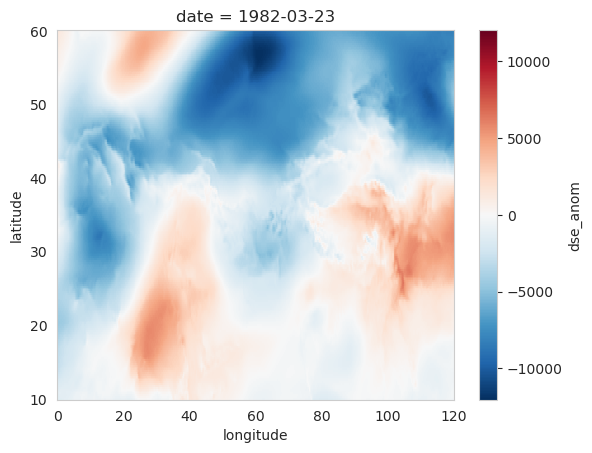

In [24]:
tst.dse_anom.plot()

In [25]:
tst.close()

In [26]:
for file in files:
    print(file)
    print("out of", pd.read_csv(dat_dir + file, parse_dates=['date']).shape[0], "nc files,")
    existing_nc_lst = [s for s in os.listdir(dir_data) if 
                      starts_with_substring_and_number(s, file.replace('.csv', '') + '_') 
                     and s.endswith('_2Dave.nc')
    ]
    print(len(existing_nc_lst), 'files exist')


Mar_negbg_amplif_ql_xy_v2.csv
out of 16 nc files,
16 files exist
Mar_negbg_decay_ql_xy_v2.csv
out of 14 nc files,
14 files exist
Mar_negbg2_amplif_ql_xy_v2.csv
out of 10 nc files,
10 files exist
Mar_negbg2_decay_nl_zNL_v2.csv
out of 11 nc files,
11 files exist
Mar_negbg2_decay_ql_xy_v2.csv
out of 12 nc files,
12 files exist


In [27]:
file = files[1]
print(file)

Mar_negbg_decay_ql_xy_v2.csv


In [28]:
df = pd.read_csv(dir_csv + file, parse_dates=['date'])
print(df.shape)
two_day_averaging = True

if two_day_averaging == True:
    nc_lst = [s for s in os.listdir(dir_data) if 
              starts_with_substring_and_number(s, file.replace('.csv', '') + '_') 
             and s.endswith('_2Dave.nc')]
else:
    nc_lst = [s for s in os.listdir(dir_data) if starts_with_substring_and_number(s, file.replace('.csv', '') + '_')]

print('len(nc_lst)', len(nc_lst))

if 'Net_Adv' not in df.columns:
    df['Net_Adv'] = df['adv_recon_2Dave'].copy()

os.chdir(dir_data)
def preprocess(ds):
    return ds.expand_dims('date')

ds_brnch = xr.open_mfdataset(nc_lst, preprocess=preprocess)
print('ds_brnch', ds_brnch.dims)

flux_dts = df.date.to_list()
print(len(flux_dts))


(14, 27)
len(nc_lst) 14
ds_brnch Frozen({'date': 14, 'latitude': 201, 'longitude': 481})
14


In [29]:
ds_brnch.dse_anom_Lag1.isel(date=0).compute()

<xarray.DataArray 'dse_anom_Lag1' (latitude: 201, longitude: 481)>
array([[  -26.44746647,     4.32040531,    35.23910311, ...,
         -308.20110453,  -326.5272585 ,  -366.10026876],
       [   54.16535917,    76.0702259 ,    91.07485444, ...,
         -310.71613682,  -322.86138562,  -362.16097025],
       [  143.49018707,   152.67387046,   153.63824205, ...,
         -302.72686418,  -327.75733371,  -362.22657563],
       ...,
       [  539.07121831,   365.71233633,   190.06121661, ...,
        -2546.34353379, -2527.81704076, -2484.94652963],
       [  568.4723281 ,   400.97623699,   226.54024605, ...,
        -2550.00601952, -2531.02671369, -2499.16554423],
       [  583.31404689,   420.53509517,   251.09186348, ...,
        -2571.16803641, -2542.39810182, -2516.51689238]])
Coordinates:
  * latitude   (latitude) float64 10.0 10.25 10.5 10.75 ... 59.5 59.75 60.0
  * longitude  (longitude) float64 0.0 0.25 0.5 0.75 ... 119.2 119.5 119.8 120.0
    date       datetime64[ns] 1980-03-12

0 Mar_negbg_amplif_ql_xy_v2.csv
(16, 27)
len(nc_lst) 16
ds_brnch Frozen({'date': 16, 'latitude': 201, 'longitude': 481})
16
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-5845.90970193)
Coordinates:
    quantile  float64 0.0
vmax =  <xarray.DataArray 'dse_anom' ()>
array(3811.20916973)
Coordinates:
    quantile  float64 1.0
num_levs =  21
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-5845.90970193)
Coordinates:
    quantile  float64 0.0
vmax =  <xarray.DataArray 'dse_anom' ()>
array(3811.20916973)
Coordinates:
    quantile  float64 1.0
num_levs =  21
rowunm 0
colnum 0
calling inner_composite() on i =  0
[########################################] | 100% Completed | 102.77 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-8636.43513289)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(3666.02281638)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.66 ms
[####################################

[########################################] | 100% Completed | 101.63 ms
[########################################] | 100% Completed | 101.61 ms
u_min =  -9.286351937912443 u_max = 11.02510562874845
v_min =  -6.985037387667374 v_max = 12.653282395878097
num_levs =  21
rowunm 5
colnum 1
calling inner_composite() on i =  11
[########################################] | 100% Completed | 102.23 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-5639.7496636)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(3857.30041223)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 102.61 ms
[########################################] | 100% Completed | 101.97 ms
u_min =  -13.461538158805023 u_max = 12.289025638246923
v_min =  -6.039988408562339 v_max = 13.590928532653129
num_levs =  21
rowunm 6
colnum 0
calling inner_composite() on i =  12
[########################################] | 100% Completed | 103.32 ms
vmin

[########################################] | 100% Completed | 101.94 ms
u_min =  -15.208528585865196 u_max = 10.631083645650243
v_min =  -11.337628201958045 v_max = 12.73773572758352
num_levs =  21
rowunm 3
colnum 0
calling inner_composite() on i =  6
[########################################] | 100% Completed | 102.13 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-8405.21466461)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(3498.87997447)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.61 ms
[########################################] | 100% Completed | 101.51 ms
u_min =  -14.116705423881989 u_max = 13.497718390220934
v_min =  -16.208171269734965 v_max = 13.400916624400224
num_levs =  21
rowunm 3
colnum 1
calling inner_composite() on i =  7
[########################################] | 100% Completed | 102.05 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-12138.86523128)
Coordinate

[########################################] | 100% Completed | 101.53 ms
[########################################] | 100% Completed | 101.40 ms
u_min =  -6.874381122447841 u_max = 22.034778555349376
v_min =  -9.912029754386651 v_max = 10.437315579012857
num_levs =  21
rowunm 1
colnum 1
calling inner_composite() on i =  3
[########################################] | 100% Completed | 102.32 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-5782.59859642)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(3810.27503956)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 102.07 ms
[########################################] | 100% Completed | 102.04 ms
u_min =  -6.059517904226562 u_max = 20.631152792751255
v_min =  -10.167056093815368 v_max = 13.611151521837025
num_levs =  21
rowunm 2
colnum 0
calling inner_composite() on i =  4
[########################################] | 100% Completed | 102.22 ms
vmin

[########################################] | 100% Completed | 101.96 ms
u_min =  -14.003300386860351 u_max = 16.03030246368567
v_min =  -12.57379858926568 v_max = 13.666803678258155
num_levs =  21
rowunm 1
colnum 0
calling inner_composite() on i =  2
[########################################] | 100% Completed | 101.98 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-6169.46987999)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(3726.09401333)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 102.90 ms
[########################################] | 100% Completed | 101.93 ms
u_min =  -6.874381122447841 u_max = 22.034778555349376
v_min =  -9.912029754386651 v_max = 10.437315579012857
num_levs =  21
rowunm 1
colnum 1
calling inner_composite() on i =  3
[########################################] | 100% Completed | 102.15 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-5782.59859642)
Coordinates:
 

[########################################] | 100% Completed | 101.64 ms
[########################################] | 100% Completed | 103.31 ms
u_min =  -15.289623975089285 u_max = 10.309035582580448
v_min =  -12.913570419085591 v_max = 12.765384161949402
num_levs =  21
rowunm 1
colnum 0
calling inner_composite() on i =  2
[########################################] | 100% Completed | 102.78 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-6169.46987999)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(3726.09401333)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 102.48 ms
[########################################] | 100% Completed | 101.87 ms
u_min =  -11.581647592736967 u_max = 16.504675887043664
v_min =  -8.405017615928772 v_max = 10.420312739973562
num_levs =  21
rowunm 1
colnum 1
calling inner_composite() on i =  3
[########################################] | 100% Completed | 103.32 ms
vm

[########################################] | 100% Completed | 103.05 ms
[########################################] | 100% Completed | 101.95 ms
u_min =  -10.905976919493245 u_max = 23.944515976562528
v_min =  -13.76329306533013 v_max = 12.751916848430454
num_levs =  21
rowunm 0
colnum 1
calling inner_composite() on i =  1
[########################################] | 100% Completed | 102.64 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-8003.13907191)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(5462.8153021)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.88 ms
[########################################] | 100% Completed | 102.10 ms
u_min =  -7.002257413369278 u_max = 18.22939972025706
v_min =  -9.89797367813173 v_max = 8.2415525039327
num_levs =  21
rowunm 1
colnum 0
calling inner_composite() on i =  2
[########################################] | 100% Completed | 101.89 ms
vmin =  <x

[########################################] | 100% Completed | 101.62 ms
[########################################] | 100% Completed | 103.74 ms
u_min =  -14.866608673895467 u_max = 9.537483258313399
v_min =  -12.471226866607205 v_max = 8.314089278600326
num_levs =  21
rowunm 2
colnum 1
calling inner_composite() on i =  5
[########################################] | 100% Completed | 102.06 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-2845.10413731)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(6716.06733515)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.63 ms
[########################################] | 100% Completed | 101.98 ms
u_min =  -19.945945759257494 u_max = 7.969539282912299
v_min =  -17.55199924082591 v_max = 8.835608938560007
num_levs =  21
rowunm 3
colnum 0
calling inner_composite() on i =  6
[########################################] | 100% Completed | 102.29 ms
vmin =

[########################################] | 100% Completed | 101.69 ms
[########################################] | 100% Completed | 101.86 ms
u_min =  -10.23128406866623 u_max = 12.836829465439337
v_min =  -14.98080278539387 v_max = 14.21771641133651
num_levs =  21
rowunm 4
colnum 0
calling inner_composite() on i =  8
[########################################] | 100% Completed | 102.41 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-3926.32235678)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(8265.28092486)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 102.12 ms
[########################################] | 100% Completed | 101.54 ms
u_min =  -10.153656210890283 u_max = 18.059197931220474
v_min =  -15.870706888457871 v_max = 13.465594939673325
num_levs =  21
rowunm 4
colnum 1
calling inner_composite() on i =  9
[########################################] | 100% Completed | 102.13 ms
vmin

rowunm 0
colnum 0
calling inner_composite() on i =  0
[########################################] | 100% Completed | 102.96 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-5433.11696341)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(7355.83311623)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.54 ms
[########################################] | 100% Completed | 101.56 ms
u_min =  -11.613663673973686 u_max = 20.484367867401435
v_min =  -14.733968257517681 v_max = 14.51220526448863
num_levs =  21
rowunm 0
colnum 1
calling inner_composite() on i =  1
[########################################] | 100% Completed | 102.25 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-8914.75819275)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(4824.58282613)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.56

[########################################] | 100% Completed | 102.37 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-4398.41870327)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(6249.87826908)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 102.28 ms
[########################################] | 100% Completed | 101.64 ms
u_min =  -10.57371457335319 u_max = 10.142488029909504
v_min =  -10.556962079408796 v_max = 14.86178251717951
num_levs =  21
rowunm 2
colnum 0
calling inner_composite() on i =  4
[########################################] | 100% Completed | 101.85 ms
vmin =  <xarray.DataArray 'dse_anom' ()>
array(-7145.7233212)
Coordinates:
    quantile  float64 0.05
vmax =  <xarray.DataArray 'dse_anom' ()>
array(7661.80821623)
Coordinates:
    quantile  float64 0.95
[########################################] | 100% Completed | 101.60 ms
[########################################] | 100% Co

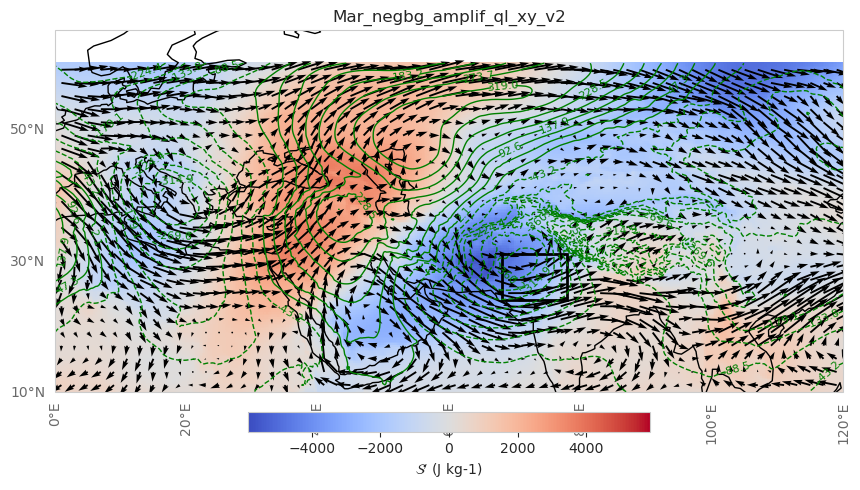

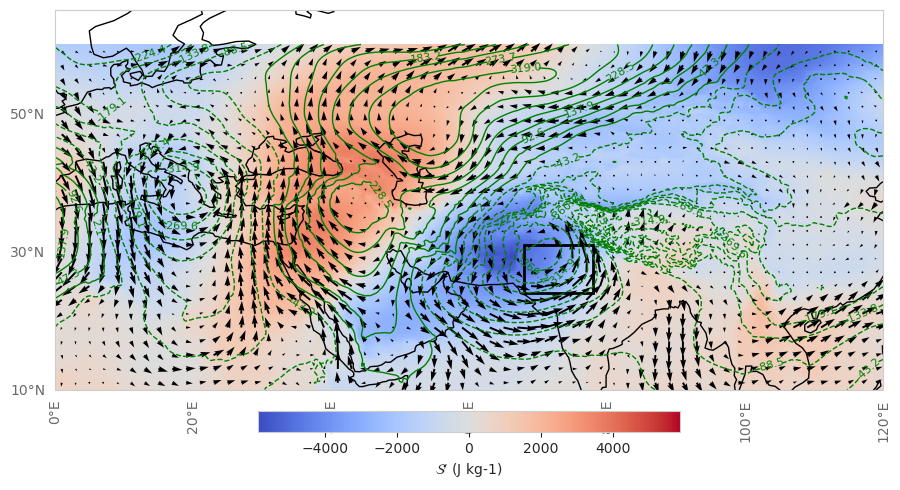

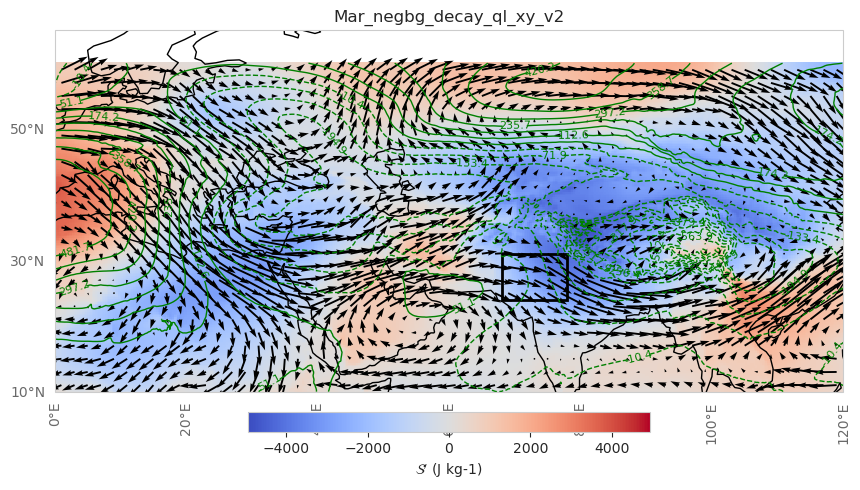

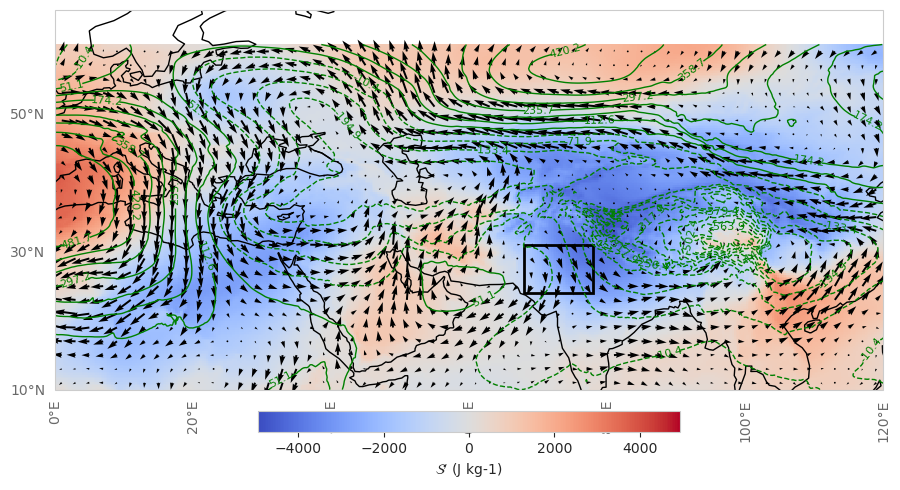

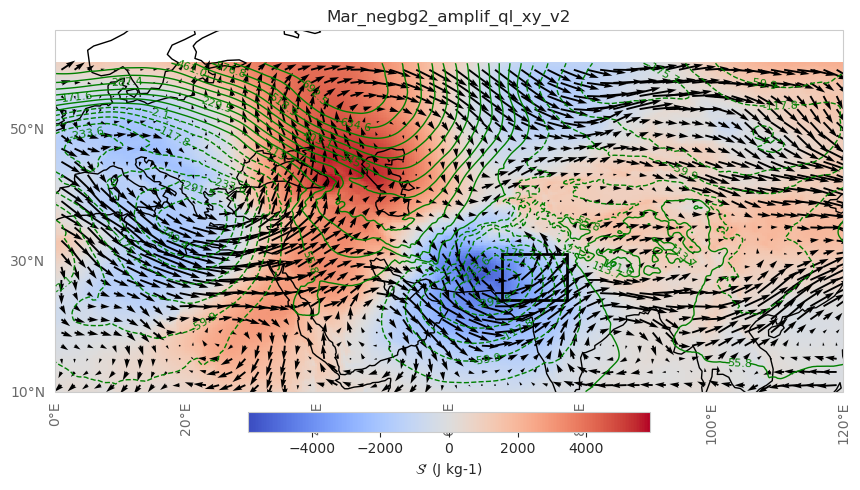

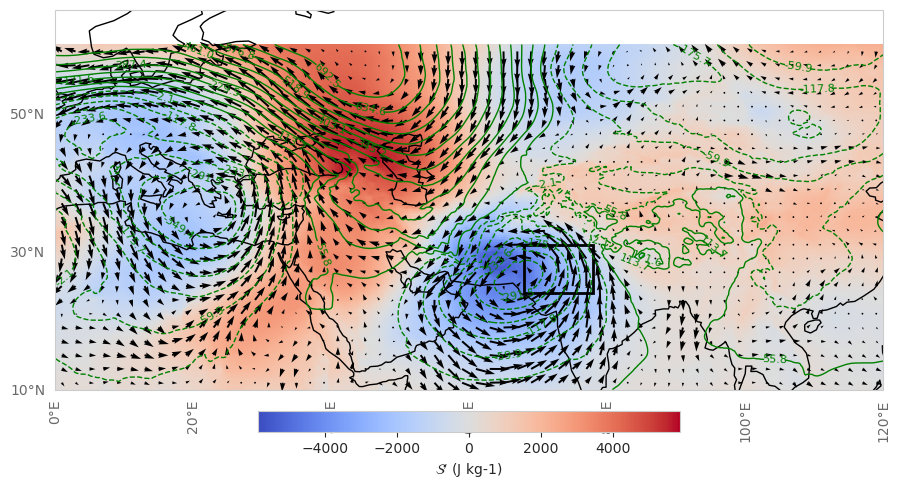

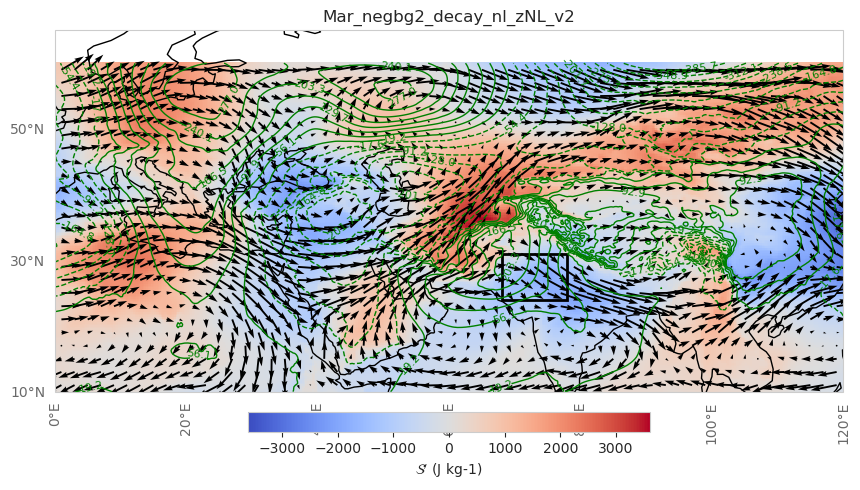

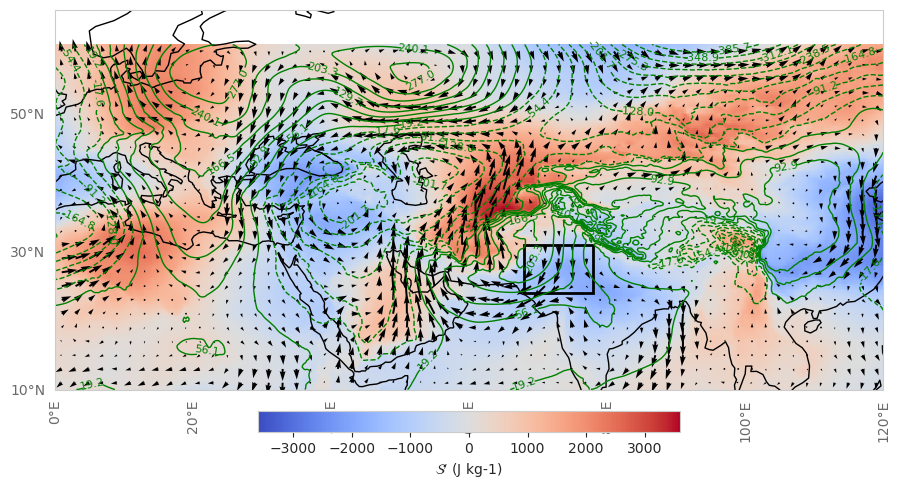

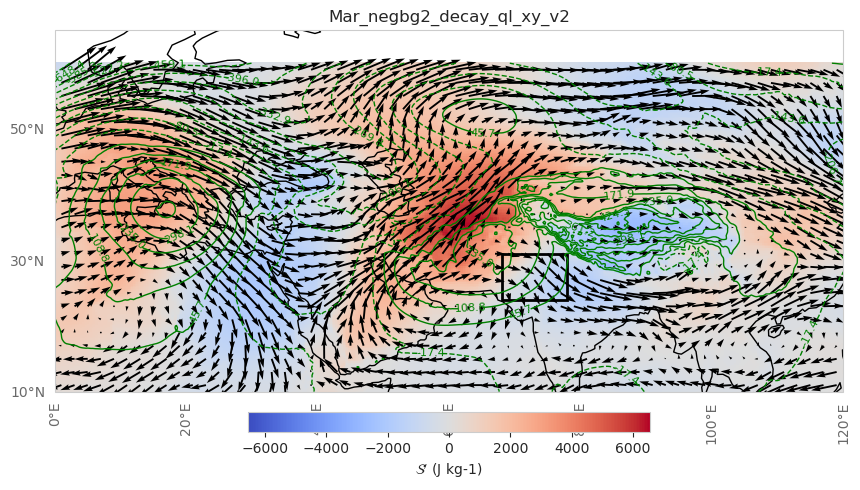

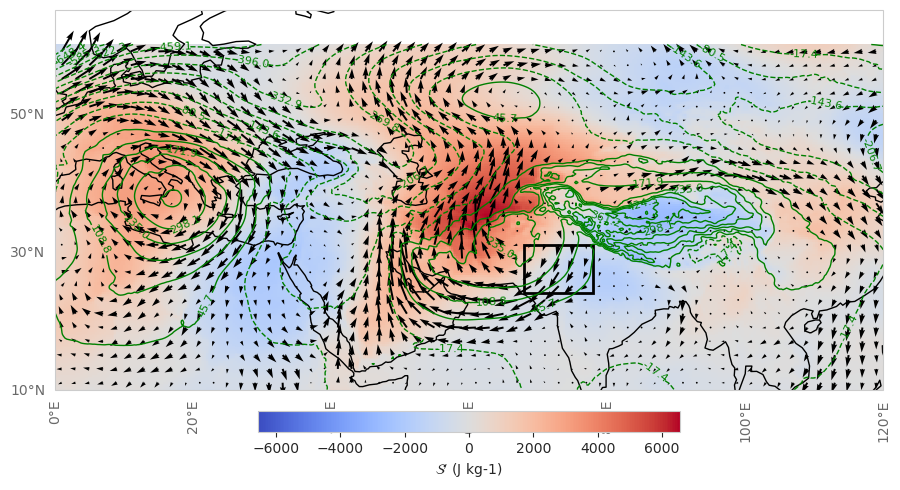

In [30]:
for i in range(len(files)):
    for two_day_averaging in [True]:
        file = files[i]
        print(i, file)

        # delete all pngs starting with the filename
        png_lst = [s for s in os.listdir(dir_plots) if s.startswith(file.replace('.csv', '')) and s.endswith('.png')]

        if len(png_lst) > 0:
            for png in png_lst:
                os.remove(dir_plots + png)
            
        df = pd.read_csv(dir_csv + file, parse_dates=['date'])
        print(df.shape)
        
        if two_day_averaging == True:
            nc_lst = [s for s in os.listdir(dir_data) if 
                      starts_with_substring_and_number(s, file.replace('.csv', '') + '_') 
                     and s.endswith('_2Dave.nc')]
        else:
            nc_lst = [s for s in os.listdir(dir_data) if starts_with_substring_and_number(s, file.replace('.csv', '') + '_')]

        print('len(nc_lst)', len(nc_lst))

        if 'Net_Adv' not in df.columns:
            df['Net_Adv'] = df['adv_recon_2Dave'].copy()

        os.chdir(dir_data)
        def preprocess(ds):
            return ds.expand_dims('date')

        ds_brnch = xr.open_mfdataset(nc_lst, preprocess=preprocess)
        print('ds_brnch', ds_brnch.dims)

        flux_dts = df.date.to_list()
        print(len(flux_dts))

        #########################################
    #     plot composites once
        save_str2 = file.replace('.csv', '_fullwnds_composite{}.png'.format('_2Dave' if two_day_averaging==True else ''))
        save_str4 = file.replace('.csv', '_anomwnds_composite{}.png'.format('_2Dave' if two_day_averaging==True else ''))

        u_var = 'u'; v_var = 'v'; z_var = 'z_anom_10D'; dse_var = 'dse_anom'
        da_plt = ds_brnch[dse_var].mean(['date']).compute()
        da_cont = ds_brnch[z_var].mean(['date']).compute()
        da_u = (ds_brnch[u_var]).mean(['date']).compute()
        da_v = (ds_brnch[v_var]).mean(['date']).compute()

        plot_composite(
            da_plt = da_plt, 
            da_cont = da_cont, 
            da_u = da_u, 
            da_v =da_v, 
            xmin=0, xmax=120, ymin=10, ymax=65, 
            cont_divisions=20, coarsen_pts=8, 
            t_type = 'dse_anom', scale_quiv= 200, 
            title_str = file.replace('.csv',''), 
            save_str = save_str2 
        )

        gc.collect()
        gc.collect()

        u_var = 'u_anom_10D'; v_var = 'v_anom_10D'; z_var = 'z_anom_10D'; dse_var = 'dse_anom'
        da_plt = ds_brnch[dse_var].mean(['date']).compute()
        da_cont = ds_brnch[z_var].mean(['date']).compute()
        da_u = (ds_brnch[u_var]).mean(['date']).compute()
        da_v = (ds_brnch[v_var]).mean(['date']).compute()


        plot_composite(        
            da_plt = da_plt, 
            da_cont = da_cont, 
            da_u = da_u, 
            da_v =da_v, 
            xmin=0, xmax=120, ymin=10, ymax=65, 
            cont_divisions=20, coarsen_pts=8,
            t_type = 'dse_anom', scale_quiv= 200, 
        #   title_str = 'dse_flx = {}, date = {}'.format(tot_flx, str(df.date.iloc[i].date()))

            save_str = save_str4
        )
        gc.collect()
        gc.collect()


        ########################################
        ## each figure has 11 rows * 2 cols = 22 plots
        num_instances_22 = int(np.round((len(flux_dts)/22)))
        rmndr_plts = int(len(flux_dts)%22)
        tot_rnds = num_instances_22 + (1 if rmndr_plts>2 else 0)
        
        if tot_rnds==0:
            continue

        for n in range(1, tot_rnds+1):
            if (tot_rnds == 1) & (num_instances_22 == 0): # there are less than 22 instances and there is only the first round
                globals()[f'brnch_dates_{n}'] = flux_dts
            elif tot_rnds == num_instances_22: # each of the >=1 rounds has 22 instances
                globals()[f'brnch_dates_{n}'] = flux_dts[(n-1)*22:n*22]
            elif tot_rnds > num_instances_22: # last figure has < 22 plots
                if n <= num_instances_22: 
                    globals()[f'brnch_dates_{n}'] = flux_dts[(n-1)*22:n*22]
                if n > num_instances_22: 
                    globals()[f'brnch_dates_{n}'] = flux_dts[-1*rmndr_plts:]
                    
            save_str1 = file.replace('.csv', '_fullwnds_{}.png'.format(str(n) + ('_2Dave' if two_day_averaging==True else '')))
            save_str3 = file.replace('.csv', '_anomwnds_{}.png'.format(str(n) + ('_2Dave' if two_day_averaging==True else '')))

    #         brnch_dates = random.sample(flux_dts, 22 if df.shape[0] > 22 else df.shape[0])
    #         plot_samples(ds = ds_brnch, save_str = save_str1)

            ds = ds_brnch.sel(date=globals()[f'brnch_dates_{n}'])

            u_var = 'u'; v_var = 'v'; z_var = 'z_anom_10D'; dse_var = 'dse_anom'
            plot_samples(ds = ds, save_str = save_str1)
            gc.collect()
            gc.collect()

            u_var = 'u_anom_10D'; v_var = 'v_anom_10D'; z_var = 'z_anom_10D'; dse_var = 'dse_anom'
        #     plot_samples(ds = ds_brnch.sel(date=brnch_dates), save_str = save_str3)
            plot_samples(ds = ds, save_str = save_str3)
            gc.collect()
            gc.collect()


## Save only composites with standardized colorbar, quivers; and formatted with font and sizes

In [31]:
params = {
    'legend.fontsize': 15,
#           'legend.title_fontsize': 10,
#           'figure.figsize': (15, 5),
         'axes.labelsize':20, # this controls labelsize of both x and y axis of main plot as well as colorbar  
         'axes.titlesize':20, # pot title size
         'xtick.labelsize':15,
         'ytick.labelsize':15, # this controls yticks labelsize of both main plot and colorbar 
#    'lines.markersize': 1,
        'font.family': 'DejaVu Serif',
}

plt.rcParams.update(params)


[30. 60. 90.]
[10. 30. 50.]
0 Mar_negbg_amplif_ql_xy_v2.csv
(16, 27)
len(nc_lst) 16
ds_brnch Frozen({'date': 16, 'latitude': 201, 'longitude': 481})
16
vmin =  -4000
vmax =  4000
1 Mar_negbg_decay_ql_xy_v2.csv
(14, 27)
len(nc_lst) 14
ds_brnch Frozen({'date': 14, 'latitude': 201, 'longitude': 481})
14
vmin =  -4000
vmax =  4000
2 Mar_negbg2_amplif_ql_xy_v2.csv
(10, 27)
len(nc_lst) 10
ds_brnch Frozen({'date': 10, 'latitude': 201, 'longitude': 481})
10
vmin =  -4000
vmax =  4000
3 Mar_negbg2_decay_nl_zNL_v2.csv
(11, 64)
len(nc_lst) 11
ds_brnch Frozen({'date': 11, 'latitude': 201, 'longitude': 481})
11
vmin =  -4000
vmax =  4000
4 Mar_negbg2_decay_ql_xy_v2.csv
(12, 27)
len(nc_lst) 12
ds_brnch Frozen({'date': 12, 'latitude': 201, 'longitude': 481})
12
vmin =  -4000
vmax =  4000


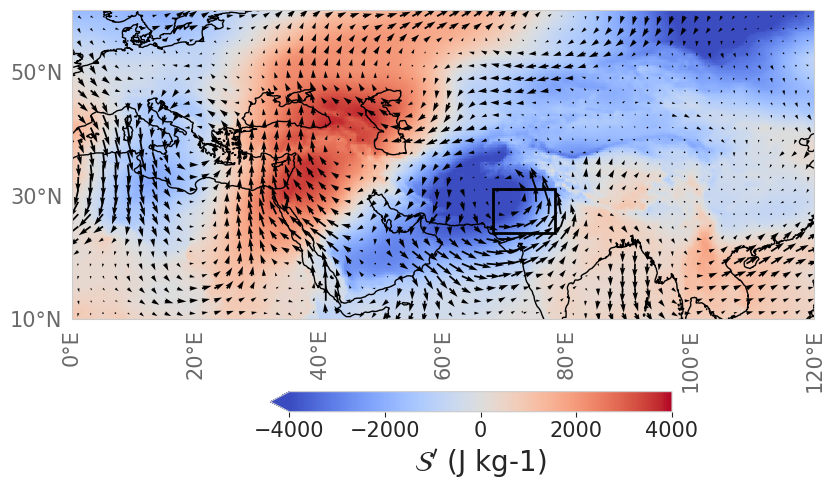

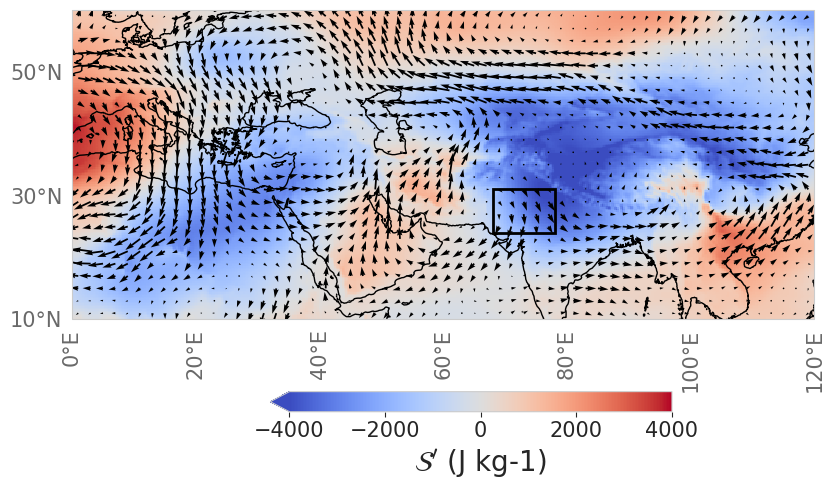

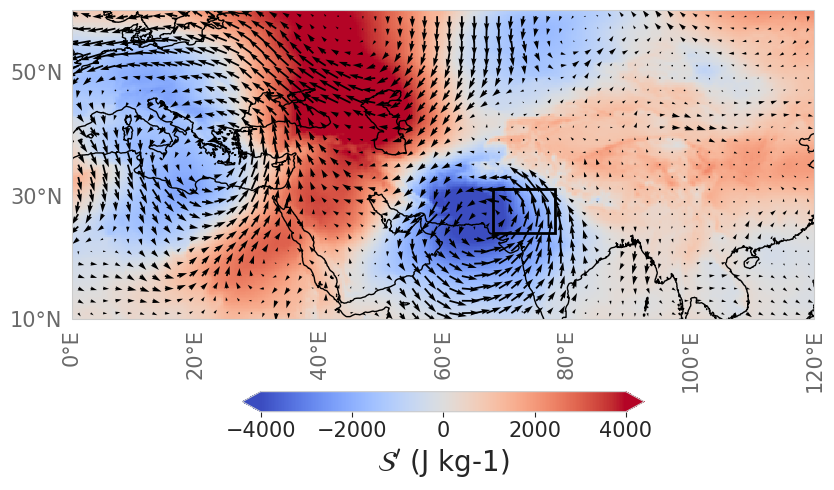

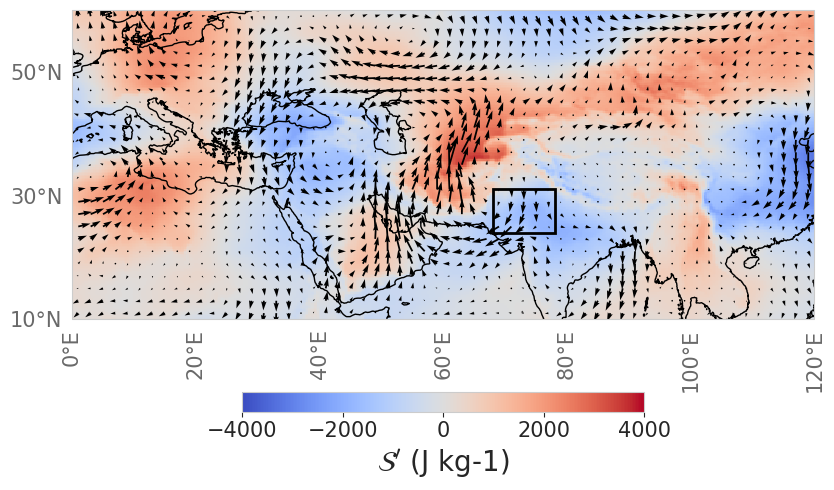

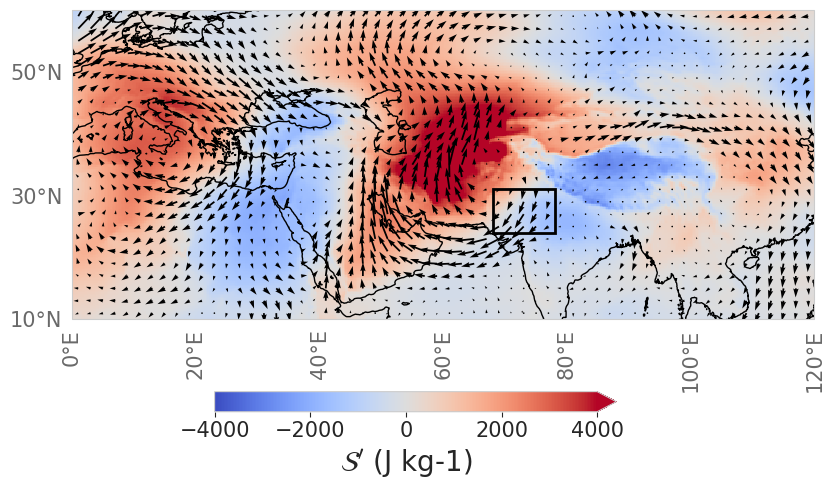

In [32]:
importlib.reload(composite_funcs)
from composite_funcs import *

for i in range(len(files)):
    for two_day_averaging in [True]:

        file = files[i]
        print(i, file)

        # delete all pngs starting with the filename
        png_lst = [s for s in os.listdir(dir_plots) if s.startswith(file.replace('.csv', '')) and s.endswith('.png')]

        if len(png_lst) > 0:
            for png in png_lst:
                os.remove(dir_plots + png)
            
        df = pd.read_csv(dir_csv + file, parse_dates=['date'])
        print(df.shape)
        
        if two_day_averaging == True:
            nc_lst = [s for s in os.listdir(dir_data) if 
                      starts_with_substring_and_number(s, file.replace('.csv', '') + '_') 
                     and s.endswith('_2Dave.nc')]
        else:
            nc_lst = [s for s in os.listdir(dir_data) if starts_with_substring_and_number(s, file.replace('.csv', '') + '_')]

        print('len(nc_lst)', len(nc_lst))
        
    
        if 'Net_Adv' not in df.columns:
            df['Net_Adv'] = df['adv_recon_2Dave'].copy()

        os.chdir(dir_data)
        def preprocess(ds):
            return ds.expand_dims('date')

        ds_brnch = xr.open_mfdataset(nc_lst, preprocess=preprocess)
        print('ds_brnch', ds_brnch.dims)

        flux_dts = df.date.to_list()
        print(len(flux_dts))

        #########################################
    #     plot composites once
        save_str4 = file.replace('.csv', '_anomwnds_composite{}.png'.format('_2Dave' if two_day_averaging==True else ''))

        u_var = 'u_anom_10D'; v_var = 'v_anom_10D'; z_var = 'z_anom_10D'; dse_var = 'dse_anom'
        da_plt = ds_brnch[dse_var].mean(['date']).compute()
        da_cont = ds_brnch[z_var].mean(['date']).compute()
        da_u = (ds_brnch[u_var]).mean(['date']).compute()
        da_v = (ds_brnch[v_var]).mean(['date']).compute()

        plot_composite(        
            da_plt = da_plt, 
            da_cont = da_cont, 
            da_u = da_u, 
            da_v =da_v, 
            xmin=da_plt.longitude.values.min().astype('int'), 
            xmax=da_plt.longitude.values.max().astype('int'), 
            ymin=da_plt.latitude.values.min().astype('int'), 
            ymax=da_plt.latitude.values.max().astype('int'), 
            vmin_in = -4000, vmax_in = 4000,
            contours='off', 
            cbar_pad=0.18,
            cont_divisions=20, coarsen_pts=8,
            t_type = 'dse_anom', scale_quiv= 200, 
            latlon_ticksz=10, 
            latlon_tickcol = 'dimgray',
            dir_out = '/home/data/lab_hardik/heatwaves/ERA5/analyses/phase_relations/plots_final/',
        #   title_str = 'dse_flx = {}, date = {}'.format(tot_flx, str(df.date.iloc[i].date()))
            save_str = save_str4
        )
        gc.collect()
        gc.collect()


In [54]:
files = [files[i] for i in [0,2,1,4,3]]

In [76]:
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as colors

importlib.reload(composite_funcs)
from composite_funcs import *

0 Mar_negbg_amplif_ql_xy_v2.csv
(16, 27)
len(nc_lst) 16
ds_brnch Frozen({'date': 16, 'latitude': 201, 'longitude': 481})
16
vmin =  -4000
vmax =  4000
1 Mar_negbg_decay_ql_xy_v2.csv
(14, 27)
len(nc_lst) 14
ds_brnch Frozen({'date': 14, 'latitude': 201, 'longitude': 481})
14
vmin =  -4000
vmax =  4000
2 Mar_negbg2_amplif_ql_xy_v2.csv
(10, 27)
len(nc_lst) 10
ds_brnch Frozen({'date': 10, 'latitude': 201, 'longitude': 481})
10
vmin =  -4000
vmax =  4000
3 Mar_negbg2_decay_nl_zNL_v2.csv
(11, 64)
len(nc_lst) 11
ds_brnch Frozen({'date': 11, 'latitude': 201, 'longitude': 481})
11
vmin =  -4000
vmax =  4000
4 Mar_negbg2_decay_ql_xy_v2.csv
(12, 27)
len(nc_lst) 12
ds_brnch Frozen({'date': 12, 'latitude': 201, 'longitude': 481})
12
vmin =  -4000
vmax =  4000
0 0
0 1
1 0
1 1


/tmp/ipykernel_3676578/3729473254.py:241: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.


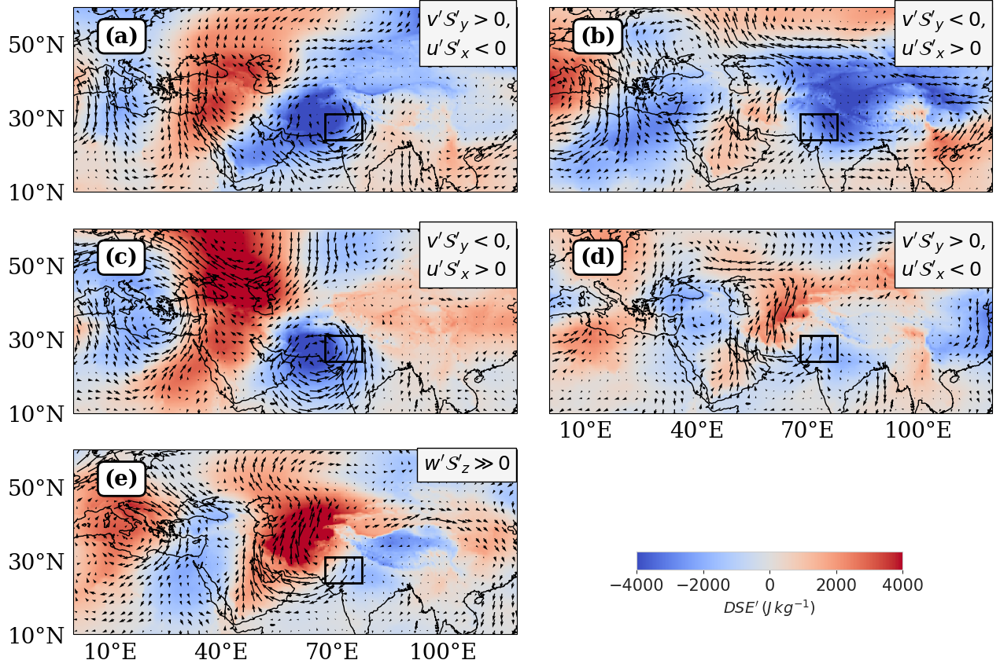

In [105]:
nrow = 3
ncol = 2

fig, ax = plt.subplots(
    nrows=nrow, ncols=ncol, 
    sharey=False, 
    subplot_kw={'projection': ccrs.PlateCarree()}, 
    figsize=(16,4*nrow),
    gridspec_kw={'hspace': 0.1}
)

props = dict(boxstyle='round', facecolor='white', alpha=1, edgecolor='k', linewidth=2)
border_thickness = 5

# for i in range(len(files)):
# axes_lst = []
k=0
# for i in [i for i in range(7) if i not in [4,5]]:
for i in range(len(files)):
    for two_day_averaging in [True]:
        file = files[i]
        print(i, file)
        
        rowind = bicol_panel_rownum(k)
        colind = bicol_panel_colnum(k)

        df = pd.read_csv(dir_csv + file, parse_dates=['date'])
        print(df.shape)
        
        if two_day_averaging == True:
            nc_lst = [s for s in os.listdir(dir_data) if 
                      starts_with_substring_and_number(s, file.replace('.csv', '') + '_') 
                     and s.endswith('_2Dave.nc')]
        else:
            nc_lst = [s for s in os.listdir(dir_data) if starts_with_substring_and_number(s, file.replace('.csv', '') + '_')]

        print('len(nc_lst)', len(nc_lst))
        
    
        if 'Net_Adv' not in df.columns:
            df['Net_Adv'] = df['adv_recon_2Dave'].copy()

        os.chdir(dir_data)
        def preprocess(ds):
            return ds.expand_dims('date')

        ds_brnch = xr.open_mfdataset(nc_lst, preprocess=preprocess)
        print('ds_brnch', ds_brnch.dims)

        flux_dts = df.date.to_list()
        print(len(flux_dts))

        #########################################
    #     plot composites once
        u_var = 'u_anom_10D'; v_var = 'v_anom_10D'; z_var = 'z_anom_10D'; dse_var = 'dse_anom'
        da_plt = ds_brnch[dse_var].mean(['date']).compute()
        da_cont = ds_brnch[z_var].mean(['date']).compute()
        da_u = (ds_brnch[u_var]).mean(['date']).compute()
        da_v = (ds_brnch[v_var]).mean(['date']).compute()

        plot_composite_final_plot(
            da_plt = da_plt, 
            da_cont = da_cont, 
            da_u = da_u, 
            da_v =da_v, 
            axi = ax[rowind, colind],
            xmin=da_plt.longitude.values.min().astype('int'), 
            xmax=da_plt.longitude.values.max().astype('int'), 
            ymin=da_plt.latitude.values.min().astype('int'), 
            ymax=da_plt.latitude.values.max().astype('int'), 
            vmin_in = -4000, vmax_in = 4000,
            
            cbar_on = False, #if rowind + 1 < nrow else True,
            cbar_pad= 0.1 if rowind + 1 < nrow else 0.3,
            t_type = 'dse_anom', 
            
            contours='off', 
            cont_divisions=20, 
            coarsen_pts=10,
            scale_quiv= 150, 
            xtickrot=0,
            ytickrot=0,
            num_xticks=4,
            num_yticks=3,
            xtick_offset=10,
            latlon_ticksz=20, 
            latlon_tickcol = 'black',
        #   title_str = 'dse_flx = {}, date = {}'.format(tot_flx, str(df.date.iloc[i].date()))
        )
        
        ax[rowind, colind].text(
            .07, .9, '({})'.format(chr(96+(k+1))), 
            transform=ax[rowind, colind].transAxes, 
            fontsize=20, fontname ='DejaVu Serif', 
              verticalalignment='top', c='k', bbox=props, fontweight='bold'
        )

        ax[rowind, colind].spines["top"].set_linewidth(border_thickness)
        ax[rowind, colind].spines["right"].set_linewidth(border_thickness)
        ax[rowind, colind].spines["bottom"].set_linewidth(border_thickness)
        ax[rowind, colind].spines["left"].set_linewidth(border_thickness)
        # Customize border color
        for spine in ax[rowind, colind].spines.values():
            spine.set_color("black")

        k = k+1
        gc.collect()
        gc.collect()

# cbar_ax = fig.add_axes([0.91, 0.15, 0.03, 0.7])
# cbar = fig.colorbar(ax[0, 0].get_images()[0], cax=cbar_ax)
# cbar.set_label('$\mathcal{S}\'$ (J kg$^{-1}$)')
for r in range(nrow):
    for c in range(ncol):
        for label in ax[r][c].get_xticklabels() + ax[r][c].get_yticklabels():
            label.set_fontname('DejaVu Serif')

comp_anns = [
    
    '$v\' \mathcal{S}\'_{y}>0$,\n$u\'\mathcal{S}\'_{x}<0$',  
    '$v\' \mathcal{S}\'_{y}<0$,\n$u\'\mathcal{S}\'_{x}>0$',  
    '$v\' \mathcal{S}\'_{y}<0$,\n$u\'\mathcal{S}\'_{x}>0$',  
    '$v\' \mathcal{S}\'_{y}>0$,\n$u\'\mathcal{S}\'_{x}<0$',      
    '$w\' \mathcal{S}\'_{z}\gg0$', 
]

props = dict(boxstyle='square', facecolor='whitesmoke', alpha=1, edgecolor='black')
annot_size = 23
# ann_coords = [.65, .7]
ann_coords = [1, 1]
fontname = 'DejaVu Serif'
# props = dict(boxstyle='round', facecolor='white', alpha=1, edgecolor='k', linewidth=2)

arrow_tip_y = 0.35
arrow_tip_x = 0.65
k=0

bbox = ax[0][0].get_position()
ref_height = 0.24  # Use the larger axes height as reference
scaled_fontsize = int(annot_size * bbox.height / ref_height)

for r in range(3):
    for c in range(2):
        if not ((r==2) and (c==1)):

            renderer = fig.canvas.get_renderer()
            text_obj = ax[r][c].annotate(
                text=comp_anns[k],
                xy=(arrow_tip_x, arrow_tip_y),
                xytext=(1.0, 1.0),
                textcoords='axes fraction',
                xycoords='axes fraction',
                fontsize=scaled_fontsize,
                fontname=fontname,
                verticalalignment='top',
                horizontalalignment='right',
                color='black',
                bbox=props,
            )

            pos = ax[r, c].get_position()
            # Shift upward and compress height
            ax[r, c].set_position([
                pos.x0 - 0.045 * (ncol + c - 2),
                pos.y0 + 0.03 * (nrow + r - 3),  # shift higher rows up more
                pos.width,
                pos.height               # compress height slightly
            ])

            # Get bounding box in display coordinates
            bbox_display = text_obj.get_window_extent(renderer=renderer)

            # Convert to axes fraction
            bbox_axes = ax[r][c].transAxes.inverted().transform_bbox(bbox_display)
            box_width = bbox_axes.width
            box_height = bbox_axes.height

            # for rounded edges
    #         if ((r==1) and (c==0)) or ((r==2) and (c==1)):
    #             text_obj.set_position((1.0 - box_width + 0.0145, 1.0 - box_height - 0.012))
    #         else:
    #             text_obj.set_position((1.0 - box_width + 0.0145, 1.0 - box_height - 0.02))

    #         # for sharp edges
    #         if ((r==1) and (c==0)) or ((r==2) and (c==1)):
    #             text_obj.set_position((1.0 - box_width + 0.02, 1.0 - box_height + 0.02))
    #         else:
    #             text_obj.set_position((1.0 - box_width + 0.02, 1.0 - box_height - 0.004)) #  - 0.008

            # for sharp edges
            if (r<2):
                print(r,c)
                text_obj.set_position((1.0 - box_width - 0.014, 1.0 - box_height - 0.01)) #  - 0.008
            else:
                text_obj.set_position((1.0 - box_width - 0.014, 1.0 - box_height- 0.02)) #

            text_obj.set_ha('left')
            text_obj.set_va('bottom')

            if not (((r == 2) and (c==0)) or ((r==1) and (c==1))):
                ax[r,c].set_xticks([])                
            if (c != 0):
                ax[r,c].set_yticks([])
            k = k +1


fig.delaxes(ax[-1, -1])  # Adjust index for the empty subplot
# plt.tight_layout()
# plt.subplots_adjust(hspace=0.2) 
# for r in range(nrow):
#     for c in range(ncol):
        
fig.patch.set_facecolor('white')  # Background color

# Get the position of the GridSpec cell (row 2, col 1)
bbox = ax[2, 0].get_position(fig)
# 
panel_width = bbox.width
panel_gap = bbox.x0 - ax[1, 0].get_position(fig).x0  # horizontal spacing between columns

# Estimate left edge of (2,1)
x1_left = bbox.x0 + panel_width + panel_gap
x1_center = x1_left + panel_width / 2

cbar_width = panel_width * 0.6
cbar_left = bbox.x0 + panel_width*1.07 + (panel_width - cbar_width) / 2
new_bottom = bbox.y0 + bbox.height * 0.35
new_height = bbox.height * 0.1

cbar_ax = fig.add_axes([cbar_left, new_bottom, cbar_width, new_height])

# new_height = bbox.height * 0.1
# new_bottom = bbox.y0 + bbox.height * 0.35  # Center vertically

# cbar_width = bbox.width *0.6
# cbar_left = bbox.x0 + (bbox.width - cbar_width) / 2  # Center horizontally

# cbar_ax = fig.add_axes([cbar_left, new_bottom, cbar_width, new_height])

norm = colors.Normalize(vmin=-4000, vmax=4000)
cmap = cm.get_cmap('coolwarm')
mappable = cm.ScalarMappable(norm=norm, cmap=cmap)
mappable.set_array([])  # Required for colorbar to work
cbar = fig.colorbar(mappable, cax=cbar_ax, orientation='horizontal')
cbar.set_label('$DSE\'\,(J\,kg^{-1})$', fontsize=14)

plt.savefig('/home/data/lab_hardik/Manuscript1/Fig_Mar_regimes_negbg_v2.pdf', bbox_inches=None)

In [61]:
i=4
print(files[i])
pd.read_csv(dir_csv + files[i]).iloc[:,:12]

Mar_negbg2_decay_nl_zNL_v2.csv


,date,$u'$$\mathcal{S}^'_x$,$v'$$\mathcal{S}^'_y$,$w'$$\mathcal{S}^'_z$,$u'$$\mathcal{S}̅_x$,$v'$$\mathcal{S}̅_y$,$w'$$\mathcal{S}̅_z$,${u̅}$$\mathcal{S}^'_x$,${v̅}$$\mathcal{S}^'_y$,${w̅}$$\mathcal{S}^'_z$,${u̅}$$\mathcal{S}̅_x$,${v̅}$$\mathcal{S}̅_y$
0,1981-03-16,-67.943737,-82.451097,905.179891,49.282274,-458.660081,1110.516530,642.301641,33.751191,216.708724,104.473174,3.492369
1,1981-03-17,112.460753,-219.003194,947.765384,41.561005,-549.365843,1332.005413,254.089709,25.832189,238.220526,94.520110,-3.362480
2,1984-03-20,303.539185,191.432355,275.483004,2.957433,-2351.768395,1945.860520,594.462023,48.720715,62.731968,19.623622,10.630188
3,1987-03-27,87.914733,-50.502464,602.186862,63.308865,-28.161721,220.344334,-167.921926,44.220378,145.599819,-15.447171,44.855239
4,1993-03-07,39.732142,561.136089,57.099687,80.341966,-1605.132209,1668.049740,111.442974,145.515138,79.935870,-90.140363,-44.661578
5,1999-03-22,46.772649,-189.199320,804.497277,45.176132,-1467.957069,1414.979432,536.483610,-38.241503,40.297684,-29.832050,9.435072
6,2007-03-06,121.839333,271.047028,163.183735,2.345970,-2045.720813,2611.293337,78.759400,37.572594,77.760446,-116.552421,-30.941559
7,2007-03-07,391.616751,371.353046,104.863635,17.917491,-1559.695402,1725.734253,-111.065063,89.825332,90.289080,-90.138113,-44.681561
8,2014-03-13,142.440786,-248.980156,643.849947,73.627041,-732.390500,1275.202028,-257.225689,95.179403,138.382978,73.649111,-23.793317
9,2014-03-14,206.489198,-59.220905,447.117448,53.618959,-399.870782,1154.299806,-367.606045,188.550230,121.388822,89.880307,-36.451144


In [ ]:
os.getcwd()

In [41]:
1

1